<a href="https://colab.research.google.com/github/szymanski52/cubism/blob/main/August31.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Dataset

In [1]:
from torchvision import transforms, datasets
import os
import zipfile
import torch.nn as nn
import gdown
from matplotlib import pyplot as plt
from torch.utils.data import Dataset
from natsort import natsorted
from PIL import Image
from google.colab import files
from torchvision import datasets, models, transforms
import cv2 as cv
import numpy as np
import torch
from torch.nn.functional import relu6 as relu6
import matplotlib.animation as animation
from IPython.display import HTML
import datetime
from torch.optim import RMSprop
from collections import OrderedDict

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!unzip drive/MyDrive/fashion.zip -d fashion
!rm -r fashion/__MACOSX

Streaming output truncated to the last 5000 lines.
  inflating: fashion/fashion1024/dbc9741224d96ce55e8d7271ab503a13.jpg  
  inflating: fashion/__MACOSX/fashion1024/._dbc9741224d96ce55e8d7271ab503a13.jpg  
  inflating: fashion/fashion1024/439b392325222507b26f6cab94503396.jpg  
  inflating: fashion/__MACOSX/fashion1024/._439b392325222507b26f6cab94503396.jpg  
  inflating: fashion/fashion1024/f8455874bcd0ab0d20d73c6de789e649.jpg  
  inflating: fashion/__MACOSX/fashion1024/._f8455874bcd0ab0d20d73c6de789e649.jpg  
  inflating: fashion/fashion1024/ff526d49db684c552bad724a55254fb8.jpg  
  inflating: fashion/__MACOSX/fashion1024/._ff526d49db684c552bad724a55254fb8.jpg  
  inflating: fashion/fashion1024/2cf45136963ef9ef6d9794d7914eb373.jpg  
  inflating: fashion/__MACOSX/fashion1024/._2cf45136963ef9ef6d9794d7914eb373.jpg  
  inflating: fashion/fashion1024/3e260bd5baaaa58327e441286d60a8f9.jpg  
  inflating: fashion/__MACOSX/fashion1024/._3e260bd5baaaa58327e441286d60a8f9.jpg  
  inflating: fashio

In [4]:
class CannyDataset(Dataset):
  def __init__(self, root_dir, transform=None):
    image_names = os.listdir(root_dir)
    self.def_img = '01361d9b8bfdcc0c6801df23d60bc692.jpg'
    self.root_dir = root_dir
    self.transform = transform
    self.image_names = natsorted(image_names)

  def __len__(self): 
    return len(self.image_names)

  def __getitem__(self, idx):
    try:
        img_path = os.path.join(self.root_dir, self.image_names[idx])
        img = cv.imread(img_path)
        img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    except:
        img_path = os.path.join(self.root_dir, self.def_img)
        img = cv.imread(img_path)
        img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    canny = cv.Canny(img, 450, 500)
    canny = cv.cvtColor(canny, cv.COLOR_BGR2RGB)
    if self.transform:
        img = self.transform(Image.fromarray(img))
        canny = self.transform(Image.fromarray(canny))
    canny = torch.clamp(canny, 0, 1e-7) * 1e+7
    return img, canny

In [5]:
ngpu = 1
device = torch.device('cuda:0' if (
    torch.cuda.is_available() and ngpu > 0) else 'cpu')
image_size = 256
transform=transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor(),
])
canny_dataset = CannyDataset(f'fashion/fashion1024', transform)

batch_size = 8
num_workers = 0 if device.type == 'cuda' else 2
pin_memory = True if device.type == 'cuda' else False

canny_dataloader = torch.utils.data.DataLoader(canny_dataset,
                                               batch_size=batch_size,
                                               num_workers=num_workers,
                                               pin_memory=pin_memory,
                                               shuffle=True,
                                               drop_last=True
                                              )

In [6]:
item = canny_dataset.__getitem__(11390)
im = item[0]
target = item[1]

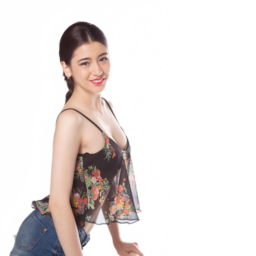

In [7]:
transforms.ToPILImage()(im)

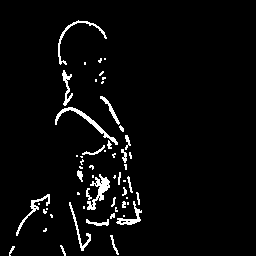

In [8]:
transforms.ToPILImage()(target)

#Model

In [9]:
rn = models.resnet50(pretrained=True)
rntr = nn.Sequential(*list(rn.children())[:-1])

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

In [10]:
rntr(target.unsqueeze(0)).shape

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


torch.Size([1, 2048, 1, 1])

In [11]:
def draw_line(c, out_size = 256, width = 1):
    e = torch.Tensor([[i for i in range(1,out_size+1)]]).to(device)
    e = e.repeat(out_size,1)
    e_x = e
    e_y = e.T
    if (c[1][1] - c[0][1]) * (c[1][0] - c[0][0]):
        kf = abs((c[1][1] - c[0][1]) / (c[1][0] - c[0][0]))
        if kf <= 1:
            if(c[1][0] < c[0][0]) and (c[1][1] < c[0][1]):
                d = width - torch.abs(e_y - (c[0][1] - c[1][1]) * (e_x - c[1][0]) / (c[0][0] - c[1][0]) - c[1][1])
                b1 = e_x - c[1][0] + 1
                b1 = torch.clamp(b1, 0, 1)
                b2 = c[0][0] - e_x + 1
                b2 = torch.clamp(b2, 0, 1)
            else:
                if (c[0][0] > c[1][0]) and (c[0][1] < c[1][1]):
                    d = width - torch.abs(e_y - (c[0][1] - c[1][1]) * (e_x - c[1][0]) / (c[0][0] - c[1][0]) - c[1][1])
                    b1 = e_x - c[1][0] + 1
                    b1 = torch.clamp(b1, 0, 1)
                    b2 = c[0][0] - e_x + 1
                    b2 = torch.clamp(b2, 0, 1)
                else:
                    d = width - torch.abs(e_y - (c[1][1] - c[0][1]) * (e_x - c[0][0]) / (c[1][0] - c[0][0]) - c[0][1])
                    b1 = e_x - c[0][0] + 1
                    b1 = torch.clamp(b1, 0, 1)
                    b2 = c[1][0] - e_x + 1
                    b2 = torch.clamp(b2, 0, 1)
        else:
            if(c[1][0] < c[0][0]) and (c[1][1] < c[0][1]):
                d = width - torch.abs(e_x - (c[0][0] - c[1][0]) * (e_y - c[1][1]) / (c[0][1] - c[1][1]) - c[1][0])
                b1 = e_y - c[1][1] + 1
                b1 = torch.clamp(b1, 0, 1)
                b2 = c[0][1] - e_y + 1
                b2 = torch.clamp(b2, 0, 1)
            else:
                if (c[0][0] < c[1][0]) and (c[0][1] > c[1][1]):
                    d = width - torch.abs(e_x - (c[0][0] - c[1][0]) * (e_y - c[1][1]) / (c[0][1] - c[1][1]) - c[1][0])
                    b1 = e_y - c[1][1] + 1
                    b1 = torch.clamp(b1, 0, 1)
                    b2 = c[0][1] - e_y + 1
                    b2 = torch.clamp(b2, 0, 1)
                else:
                    d = width - torch.abs(e_x - (c[1][0] - c[0][0]) * (e_y - c[0][1]) / (c[1][1] - c[0][1]) - c[0][0])
                    b1 = e_y - c[0][1] + 1
                    b1 = torch.clamp(b1, 0, 1)
                    b2 = c[1][1] - e_y + 1
                    b2 = torch.clamp(b2, 0, 1)
    elif not (c[1][0] - c[0][0]):
        d = width - torch.abs(e_x - c[0][0])
        b1 = max(c[0][1], c[1][1]) - e_y + 2
        b1 = torch.clamp(b1, 0, 1)
        b2 = e_y - min(c[0][1], c[1][1])
        b2 = torch.clamp(b2, 0, 1)
    else:
        if c[0][0] > c[1][0]:
            d = width - torch.abs(e_y - c[0][1])
            b1 = e_x - c[1][0] + 1
            b1 = torch.clamp(b1, 0, 1)
            b2 = c[0][0] - e_x + 1
            b2 = torch.clamp(b2, 0, 1)
        else:
            d = width - torch.abs(e_y - c[1][1])
            b1 = e_x - c[0][0] + 1
            b1 = torch.clamp(b1, 0, 1)
            b2 = c[1][0] - e_x + 1
            b2 = torch.clamp(b2, 0, 1)
    k = d * (d > 0)
    f = (k * b1 * b2).clamp(0, 1e-5) * 1e+5
    return f

In [12]:
from torch.nn import Module
from typing import Tuple, Union
from torch import Tensor
from torch.types import _size


class Render(Module):
    __constants__ = ['out_size', 'line_w']
    out_size: int
    line_w: int

    def __init__(self, out_size: int = 256, line_w: int = 10) -> None:
        super(Render, self).__init__()
        self.out_size = out_size
        self.line_w = line_w

    def forward(self, input: Tensor, lines_n) -> Tensor:
        points = input.reshape(input.shape[0],lines_n,2,2)
        silhouettes = torch.Tensor().to(device)
        for k in points:
            silhouette = torch.zeros((3, self.out_size, self.out_size)).to(device)
            for l in k:
                s = draw_line(l, width=self.line_w)
                silhouette[0] += s
                silhouette[1] += s
                silhouette[2] += s
            silhouettes = torch.cat((silhouettes, silhouette))
        silhouettes = silhouettes.resize(input.shape[0], 3,
                                         self.out_size,
                                         self.out_size)  
        return silhouettes


In [13]:
class LinesGenerator(nn.Module):
    def __init__(self, lines_n):
        self.points = None
        super(LinesGenerator, self).__init__()

        self.lines_n = lines_n
        rn_model = models.resnet50(pretrained=True)
        self.rn = nn.Sequential(*list(rn_model.children())[:-1])

        for i in self.rn.parameters():
            i.requires_grad = False
        
        self.layers = nn.Sequential(OrderedDict([
          ('flatten', nn.Flatten()),

          ('fc1', nn.Linear(2048, 1792)),
          ('bn1', nn.BatchNorm1d(1792)),
          ('dp1', nn.Dropout(0.1)),
          ('fc2', nn.Linear(1792, 1536)),
          ('bn2', nn.BatchNorm1d(1536)),
          ('dp2', nn.Dropout(0.1)),
          ('fc3', nn.Linear(1536, 1280)),
          ('bn3', nn.BatchNorm1d(1280)),
          ('dp3', nn.Dropout(0.1)),
          ('tanh1', nn.Tanh()),

          ('fc4', nn.Linear(1280, 1024)),
          ('bn4', nn.BatchNorm1d(1024)),
          ('dp4', nn.Dropout(0.1)),
          ('fc5', nn.Linear(1024, 768)),
          ('bn5', nn.BatchNorm1d(768)),
          ('dp5', nn.Dropout(0.1)),
          ('fc6', nn.Linear(768, 512)),
          ('bn6', nn.BatchNorm1d(512)),
          ('dp6', nn.Dropout(0.1)),
          ('tanh2', nn.Tanh()),

          ('fc7', nn.Linear(512, 256)),
          ('bn7', nn.BatchNorm1d(256)),
          ('dp7', nn.Dropout(0.1)),
          ('fc8', nn.Linear(256, 192)),
          ('bn8', nn.BatchNorm1d(192)),
          ('dp8', nn.Dropout(0.1)),
          ('fc9', nn.Linear(192, 128)),
          ('bn9', nn.BatchNorm1d(128)),
          ('dp9', nn.Dropout(0.1)),
          ('tanh3', nn.Tanh()),

          ('fc10', nn.Linear(128, 100)),
          ('bn10', nn.BatchNorm1d(100)),
          ('dp10', nn.Dropout(0.1)),
          ('tanh4', nn.Tanh()),

          ('fc11', nn.Linear(100, lines_n * 4)),
          ('bn11', nn.BatchNorm1d(lines_n * 4)),
          ('sigmoid', nn.Sigmoid()),
        ]))
        
        self.render = Render(line_w=1)


    def forward(self, X):
        x = self.rn(X)
        x = self.layers(x)        
        x = x * 255
        self.points = x
        x = self.render(x, self.lines_n)
        return x

In [14]:
model = LinesGenerator(30)
model.cuda()
try:
    #print('New model')
    state_dict = torch.load('drive/MyDrive/checkpoint3.pth')
    model.load_state_dict(state_dict)
except:
    print('Model load has failed')

model

LinesGenerator(
  (rn): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
          (0): Conv2d(64

#Discriminator

In [15]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.layers = nn.Sequential(
            nn.Conv2d(3, 8, 8, 2, 3),
            nn.BatchNorm2d(8),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(8, 16, 8, 2, 3),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(16, 32, 6, 2, 2),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(32, 64, 4, 2, 1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64, 128, 4, 2, 1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(128, 128, 8, 1),
            nn.Flatten(),
            nn.BatchNorm1d(128),
            nn.Linear(128, 1)
        )

    def forward(self, X):
        return self.layers(X)

#Training

In [16]:
def weighted_loss(x, target, toleracy=0.3, penalty=100):
    criterion = nn.MSELoss(reduction='none')
    a = x
    b = target
    c = b * a
    l1 = criterion(c, b) * penalty
    d = (1 - b) * a
    l2 = criterion(d, b) * toleracy
    l = l1 + l2
    return l.mean()

In [17]:
def wasserstein_loss(y_pred, y_true):
    return -1 * (y_pred * y_true).mean()

In [18]:
discriminator_channels = 64

#discriminator = Discriminator(discriminator_channels, 3)
discriminator = Discriminator()
if (device.type == 'cuda' and ngpu > 0):
    discriminator = nn.DataParallel(discriminator, list(range(ngpu)))

discriminator
try:
    #print('New model')
    state_disc_dict = torch.load('drive/MyDrive/disc_checkpoint3.pth')
    discriminator.load_state_dict(state_disc_dict)
except:
    print('Model load has failed')

In [19]:
def check_by_index(model, index):
    item = canny_dataset.__getitem__(index)
    im = item[0]
    target = item[1]
    model.eval()
    out = model(im.to(device).unsqueeze(0))
    img = transforms.ToPILImage()(out[0])
    loss = criterion(out[0], (target).to(device))
    print(criterion._get_name(), loss)
    return img, transforms.ToPILImage()(out[0]+target.to(device)), out, transforms.ToPILImage()(target)

In [ ]:
from torch.utils.data.dataset import random_split

EPOCHS = 100
LR = 5e-5
disc_LR = 5e-5
beta1 = 0.5
beta2 = 0.999
n_critic = 5
generator_losses = []
discriminator_losses = []
results = []
cannies = []

criterion = nn.MSELoss()
optimizer = RMSprop(model.parameters(), lr=LR, eps=1e-8)
discriminator_optim = torch.optim.Adam(discriminator.parameters(),
                                       lr=disc_LR,
                                       betas=(beta1, beta2))
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, 1e-2, gamma=1e-6)
device = torch.device('cuda:0')

 
for epoch in range(1, EPOCHS + 1):
    for i, (img_batch, target_batch) in enumerate(canny_dataloader):
        for j in range(n_critic):
            discriminator.zero_grad()
            batch_size = target_batch.size(0)
            real_labels = torch.ones((batch_size,)) * -1
            real_labels = real_labels.to(device)
            target_batch = target_batch.to(device)
            output = discriminator(target_batch).view(-1)
            discriminator_real_loss = wasserstein_loss(output, real_labels)
            #discriminator_real_loss.backward()
            D_x = output.mean().item()

            fake_batch = model(target_batch)
            fake_labels = torch.ones((batch_size,))
            fake_labels = fake_labels.to(device)
            output = discriminator(fake_batch.detach()).view(-1)
            discriminator_fake_loss = wasserstein_loss(output, fake_labels)
            #discriminator_fake_loss.backward()
            D_G_z1 = discriminator_fake_loss.mean().item()
            discriminator_loss = discriminator_real_loss - discriminator_fake_loss
            discriminator_loss.backward()
            nn.utils.clip_grad_norm_(discriminator.parameters(), max_norm=1.0, norm_type=2)
            discriminator_optim.step()

        model.zero_grad()
        output = discriminator(fake_batch).view(-1)
        gen_output = model(target_batch)
        generator_loss = wasserstein_loss(output, fake_labels)
        #generator_loss.backward()
        generator_w_loss = weighted_loss(gen_output, target_batch, 1.5, 1) * generator_loss
        generator_w_loss.backward()
        D_G_z2 = output.mean().item()
        nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0, norm_type=2)
        optimizer.step()
        print(f'BATCH: {i+1}')
        if not (i + 1) % 10:
            f = check_by_index(model, 5000)
            results.append(f[0])
            cannies.append(f[1])
        if not (i + 1) % 25:
            f = check_by_index(model, 5000)
            f[0].save('drive/MyDrive/v1/res3' + datetime.datetime.now().__str__() + '.png')
            f[1].save('drive/MyDrive/v1/can3' + datetime.datetime.now().__str__() + '.png')
        if (i + 1) == 50: break
        discriminator_losses.append(discriminator_loss.item())
        generator_losses.append(generator_w_loss.item())
    if not epoch % 2:
        torch.save(model.state_dict(), 'drive/MyDrive/checkpoint3.pth')
        torch.save(discriminator.state_dict(), 'drive/MyDrive/disc_checkpoint3.pth')
    print(
        f'{epoch}: Loss_D:{discriminator_loss.item():4f} Loss_G:{generator_loss.item():4f} D(x):{D_x:4f} D(G(z)):{D_G_z1:4f}/{D_G_z2:4f}'
    )

torch.save(model.state_dict(), 'drive/MyDrive/checkpoint3.pth')
torch.save(discriminator.state_dict(), 'drive/MyDrive/disc_checkpoint3.pth')

/usr/local/lib/python3.7/dist-packages/torch/_tensor.py:490: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


BATCH: 1
BATCH: 2
BATCH: 3
BATCH: 4
BATCH: 5
BATCH: 6
BATCH: 7
BATCH: 8


#Results

In [21]:
import matplotlib.pyplot as plt

No handles with labels found to put in legend.


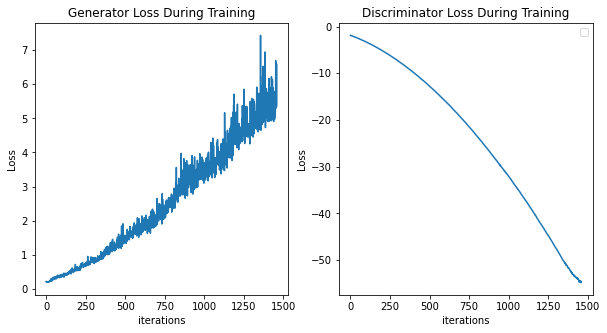

In [22]:
plt.figure(figsize=(10, 5))
plt.subplot(1,2,1)
plt.title("Generator Loss During Training")
plt.plot(generator_losses)
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.subplot(1,2,2)
plt.title("Discriminator Loss During Training")
plt.plot(discriminator_losses)
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

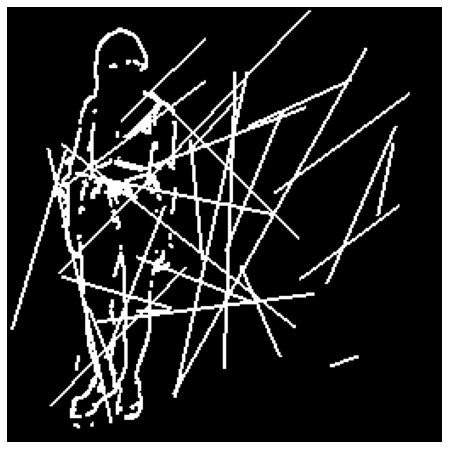

In [23]:
fig = plt.figure(figsize=(8, 8))
plt.axis("off")
ims = [[plt.imshow(i, animated=True)] for i in cannies]
ani = animation.ArtistAnimation(fig,
                                ims,
                                interval=1000,
                                repeat_delay=1000,
                                blit=True)

HTML(ani.to_jshtml())

#Evaluation

In [30]:
criterion = nn.MSELoss()
res = check_by_index(model, 7390)

MSELoss tensor(0.1036, device='cuda:0', grad_fn=<MseLossBackward>)


/usr/local/lib/python3.7/dist-packages/torch/_tensor.py:490: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


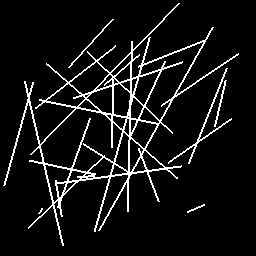

In [31]:
res[0]

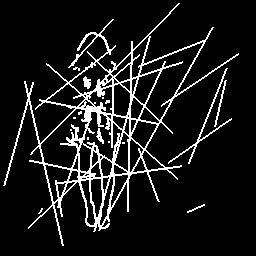

In [26]:
res[1]

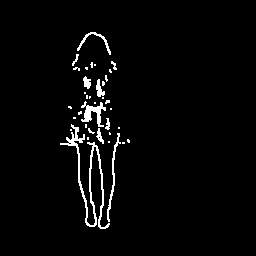

In [27]:
res[3]